<a href="https://colab.research.google.com/github/takao8/MLTSA_JClifford/blob/master/HW4/HW4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MLTSA HW 4, by Jon Clifford

In [1]:
!pip install ruptures
import ruptures as rpt
import pylab as pl
import pandas as pd
%pylab inline

  Created wheel for ruptures: filename=ruptures-1.0.3-cp36-none-any.whl size=55251 sha256=817d5d6cfd5067280e995d691b234058ef57bc8d97faf36a1d1e2ae36a3786a5
  Stored in directory: /root/.cache/pip/wheels/8b/a2/15/6e7b600d1415d6d3e746e3004dc23eef3bf7778d35e6afebac
Successfully built ruptures
Populating the interactive namespace from numpy and matplotlib


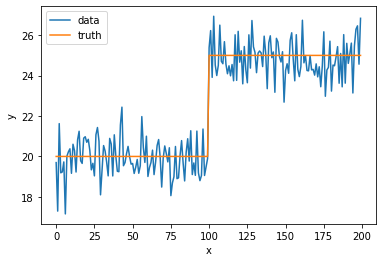

In [2]:
mu1, mu2 = 20, 25
x = np.arange(200)
ym = np.concatenate([np.random.randn(100) + mu1, np.random.randn(100) + mu2])
pl.plot(x, ym, label="data") 
pl.plot(range(200), [mu1] * 100 + [mu2] * 100, label="truth")
pl.xlabel("x")
pl.ylabel("y")
pl.legend();

Figure 1: Plot of our data over time.  Data is composed of two independent Gaussians with same variance and means of 20 and 25 over the points [0:100] and [101:200], respectively.

In [3]:
def maxdiff(y):
    """calculates the POC as the points that maximized the difference between the mean before and the mean after the POC
    y: vector of endogenouos variables
    
    """
    N = len(y)
    f = np.nanmean
    poc, diff, before, after = 0, 0, np.nan, np.nan
    for i in range(1, N):
        diff_here = np.abs(f(y[i:]) -  f(y[:i]))
        if diff < diff_here:
            diff = diff_here
            poc = i
            before, after = f(y[:i]), f(y[i:])
    return(poc, before, after)  

print("poc: {:.2f}, mean before: {:.2f}, mean after: {:.2f}".format(*maxdiff(ym)))

poc: 100.00, mean before: 19.90, mean after: 24.82


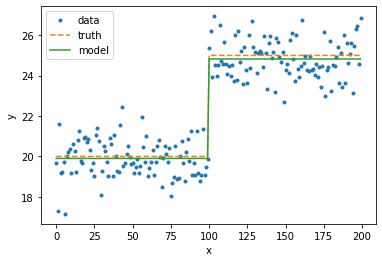

In [4]:
poc, before, after = maxdiff(ym)   
pl.plot(x, ym, '.', label="data")
pl.plot(range(200), [mu1] * 100 + [mu2] * 100, '--', label="truth")
pl.plot(x, [before] * poc + [after] * (len(ym) - poc), label="model")
pl.xlabel('x')
pl.ylabel('y');
pl.legend();

Figure 2: Results of our model by maximizing the difference in means using a single point.  Results show that x=100 is where the expectation difference was maximum.  Note that only one split point is assumed.

In [5]:
def poc_mse(y):
    poc, diff, before, after = 0, np.inf, np.nan, np.nan
    f = np.nanmean
    for i in range(1, len(y)):
      diff_here = sum((y[:i] - f(y[:i]))**2) + sum((y[i:] - f(y[i:]))**2)
      if diff_here < diff:
        diff = diff_here
        poc = i
        before, after = f(ym[:i]), f(ym[i:]) #sum((y[:i] - f(y[:i]))**2), sum((y[i:] - f(y[i:]))**2)
    return poc, before, after
print("poc: {:.2f}, mean before: {:.2f}, mean after: {:.2f}".format(*poc_mse(ym)))

poc: 100.00, mean before: 19.90, mean after: 24.82


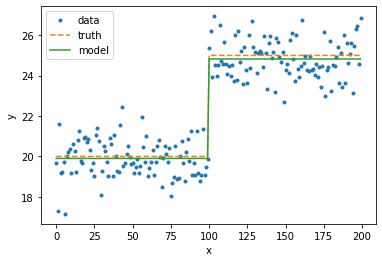

In [6]:
poc, before, after = poc_mse(ym)
pl.plot(x, ym, '.', label = 'data')
pl.plot(x, [mu1] * 100 + [mu2] * 100, '--', label="truth")
pl.plot(x, [before]*poc + [after]*(len(ym)-poc), label='model')
pl.xlabel('x')
pl.ylabel('y');
pl.legend();

Figure 3: Similar to Figure 2 except minimizing MSE instead of maximizing the difference in expectation over the data points, assuming 1 split point.

# Split Point based off Difference in Variance

In [0]:
mu = 20
x = np.arange(200)
ys = np.concatenate([np.random.randn(100) + mu, np.random.randn(100)*4 + mu])

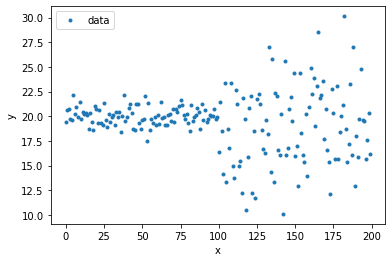

In [8]:
pl.plot(x, ys, '.', label='data')
pl.xlabel('x')
pl.ylabel('y')
pl.legend()

Figure 4: Plot of our data from two independent gaussians, with x < 100 $\in$ N(20, 1) and x >= 100 $\in$ N(20, 4).

In [9]:
def maxdiff(y, sigma=False):
    """calculates the POC as the points that maximized the difference between the mean before and the mean after the POC
    y: vector of endogenouos variables
    
    sigma: optional parameter, True if calculates the POC as the points that maximize
    the difference in the variance
    """
    N = len(y)
    if sigma==False:
      f = np.nanmean
    else:
      f = np.nanstd
    poc, diff, before, after = 0, 0, np.nan, np.nan
    for i in range(1, N):
        diff_here = np.abs(f(y[i:]) -  f(y[:i]))
        if diff < diff_here:
            diff = diff_here
            poc = i
            before, after = f(y[:i]), f(y[i:])
    return(poc, before, after)  

print("poc: {:.2f}, standard deviation before: {:.2f}, standard deviation after: {:.2f}".format(*maxdiff(ys, 
                                                                    sigma=True)))

poc: 100.00, standard deviation before: 0.88, standard deviation after: 4.10


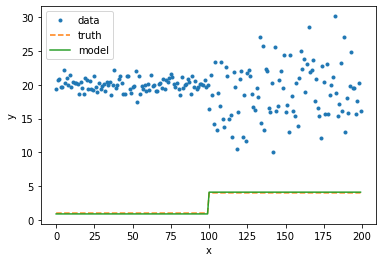

In [10]:
poc, before, after = maxdiff(ys, sigma=True)   
pl.plot(x, ys, '.', label="data")
pl.plot(range(200), [1] * 100 + [4] * 100, '--', label="truth")
pl.plot(x, [before] * poc + [after] * (len(ym) - poc), label="model")
pl.xlabel('x')
pl.ylabel('y');
pl.legend();

Figure 5: Results of modelling our changepoint by maximizing the difference in variance.  In our case, we got a perfect split at POC=100.

# Finding POC with Rupture Package

In [11]:
!pip install ruptures
import ruptures as rpt

In [0]:
# Pelt = Penalized Changepoint Detection.
# model = specified model
algo = rpt.Pelt().fit(ym)

In [0]:
result = algo.predict(10)   # should return [num, end] for a high enough penalty value.
# note that if the penalty isn't high enough, it'll return more numbers of split
# points that aren't there.  By default, we'll use 10.

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f37bdc52278>])

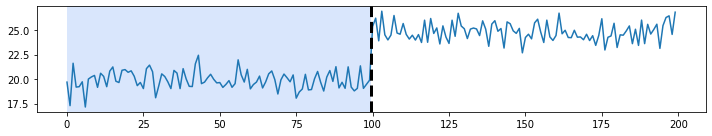

In [14]:
rpt.display(ym, [100], result)

Figure 6: Result of the Rupture package by minimizing over the l2 error, similar to Figure 3.

In [0]:
algo = rpt.Pelt(model='normal').fit(ys)
result = algo.predict(10)

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f37bdc375f8>])

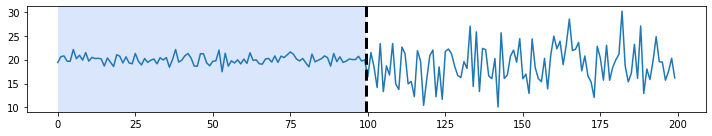

In [16]:
rpt.display(ys, [100], result)

Figure 7: Result of the Rupture package by minimizing over a Gaussian process change.  It detects changes in the mean or standard deviation of a Gaussian time series, which for this case, changes from variance 1 to variance 4.  Note that this method could have also been used in Figure 6.

# Earthquake Prediction

In [0]:
dat = pd.read_csv('http://fbb.space/mltsa/LALNeq.csv')

In [0]:
dat = dat.iloc[:, 1:]

In [19]:
dat.describe()

,acoustic_data,time_to_failure
count,4.500000e+06,4.500000e+06
mean,4.616407e+00,8.852012e-01
std,2.614006e+01,3.374432e-01
min,-4.621000e+03,3.008971e-01
25%,2.000000e+00,5.934956e-01
50%,5.000000e+00,8.849986e-01
75%,7.000000e+00,1.177597e+00
max,3.252000e+03,1.469100e+00


This is the basic statistics of our dataset.

In [20]:
dat.head()

,acoustic_data,time_to_failure
0,12,1.4691
1,6,1.4691
2,8,1.4691
3,5,1.4691
4,8,1.4691


# Using Rupture

Using Dynamic Programming gives us a running time of $O(k N^2)$, giving us the following results:

Text(0.5, 1, 'N=10000, bkps=1')

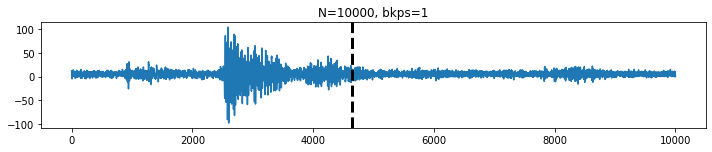

In [525]:
# dynamic programming has it:
# http://dev.ipol.im/~truong/ruptures-docs/build/html/detection/dynp.html
algo = rpt.Dynp(model='normal').fit_predict(dat["acoustic_data"][:10000].to_numpy(), n_bkps=1)
rpt.display(dat["acoustic_data"][:10000].to_numpy(), [], algo)
pl.title('N=10000, bkps=1')
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 8: Results of the Rupture POC detection using 10000 datapoints for 1 breakpoint

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f37b0f54908>])

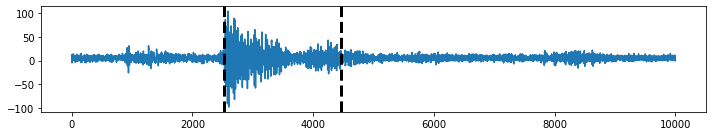

In [526]:
algo = rpt.Dynp(model='normal').fit_predict(dat["acoustic_data"][:10000].to_numpy(), n_bkps=2)
rpt.display(dat["acoustic_data"][:10000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 9: Results of the Rupture POC detection using 10000 datapoints for 2 breakpoints

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f378a613d68>])

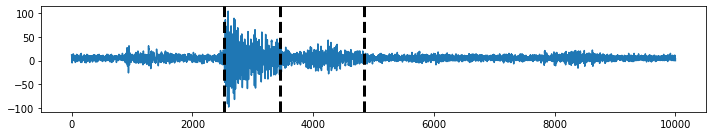

In [527]:
algo = rpt.Dynp(model='normal').fit_predict(dat["acoustic_data"][:10000].to_numpy(), n_bkps=3)
rpt.display(dat["acoustic_data"][:10000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 10: Results of the Rupture POC detection using 10000 datapoints for 3 breakpoints

And now for 5000 datapoints:

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f378a613b38>])

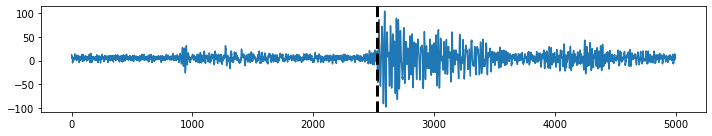

In [528]:
algo = rpt.Dynp(model='normal').fit_predict(dat["acoustic_data"][:5000].to_numpy(), n_bkps=1)
rpt.display(dat["acoustic_data"][:5000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 11: Results of the Rupture POC detection using 5000 datapoints for 1 breakpoint

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f37b91cbe80>])

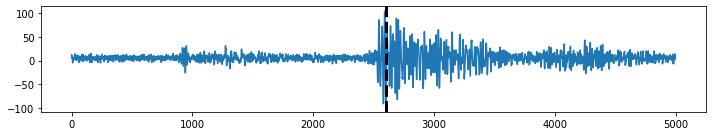

In [529]:
algo = rpt.Dynp().fit_predict(dat["acoustic_data"][:5000].to_numpy(), n_bkps=2)
rpt.display(dat["acoustic_data"][:5000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 12: Results of the Rupture POC detection using 5000 datapoints for 2 breakpoints

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f37ba6d9588>])

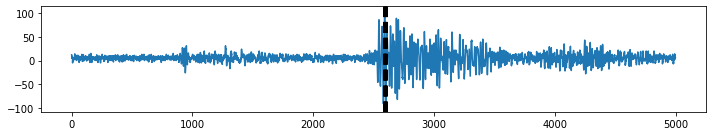

In [530]:
algo = rpt.Dynp().fit_predict(dat["acoustic_data"][:5000].to_numpy(), n_bkps=3)
rpt.display(dat["acoustic_data"][:5000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 13: Results of the Rupture POC detection using 5000 datapoints for 3 breakpoints

And finally, 1000 datapoints:

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f37ba49b4e0>])

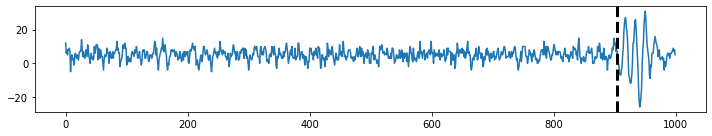

In [532]:
algo = rpt.Dynp(model='normal').fit_predict(dat["acoustic_data"][:1000].to_numpy(), n_bkps=1)
rpt.display(dat["acoustic_data"][:1000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 14: Results of the Rupture POC detection using 1000 datapoints for 1 breakpoint

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f37baa0b908>])

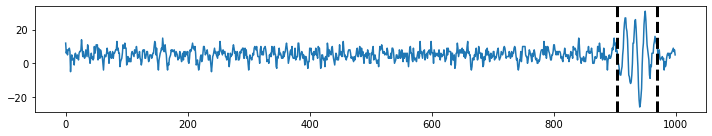

In [533]:
algo = rpt.Dynp(model='normal').fit_predict(dat["acoustic_data"][:1000].to_numpy(), n_bkps=2)
rpt.display(dat["acoustic_data"][:1000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 15: Results of the Rupture POC detection using 1000 datapoints for 2 breakpoints

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f37b7f7fd68>])

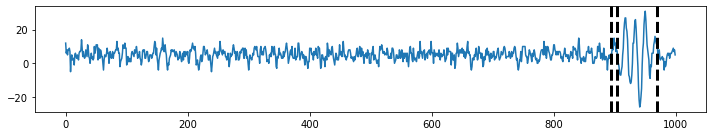

In [534]:
algo = rpt.Dynp(model='normal').fit_predict(dat["acoustic_data"][:1000].to_numpy(), n_bkps=3)
rpt.display(dat["acoustic_data"][:1000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 16: Results of the Rupture POC detection using 1000 datapoints for 3 breakpoints.  Note here that all of the breakpoints are centered at the point where the variance changes dramatically, near point 900.

Binary segmentation, which involves splitting the series in half around the breakpoint that's found, is a much faster method than dynamic programming, giving an $O(N lg(N))$ running time, just like the better sorting algorithms.

I want to note overall that binary segmentation gave essentially the same results at a fraction of the computation time as dynamic programming.

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f37b76e6438>])

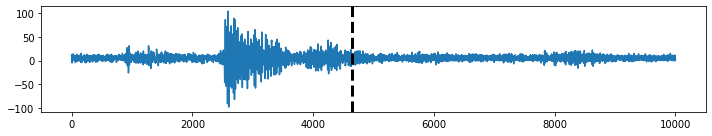

In [535]:
# binseg is O(n lg(N)):
algo = rpt.Binseg(model='normal').fit_predict(dat["acoustic_data"][:10000].to_numpy(), n_bkps=1)
rpt.display(dat["acoustic_data"][:10000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 17: Binary segmentation result with N=10000 and 1 breakpoint

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f37b8940198>])

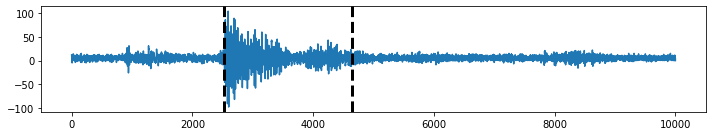

In [536]:
algo = rpt.Binseg(model='normal').fit_predict(dat["acoustic_data"][:10000].to_numpy(), n_bkps=2)
rpt.display(dat["acoustic_data"][:10000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 18: Binary segmentation result with N=10000 and 2 breakpoints

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f3786e35c88>])

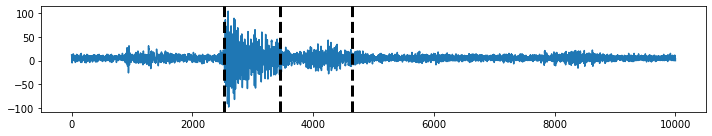

In [537]:
algo = rpt.Binseg(model='normal').fit_predict(dat["acoustic_data"][:10000].to_numpy(), n_bkps=3)
rpt.display(dat["acoustic_data"][:10000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 19: Binary segmentation result with N=10000 and 3 breakpoint

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f37bae7fb00>])

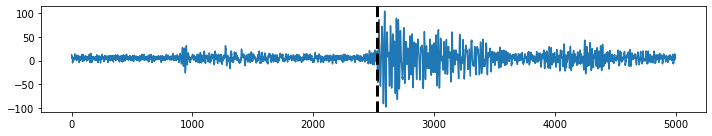

In [538]:
algo = rpt.Binseg(model='normal').fit_predict(dat["acoustic_data"][:5000].to_numpy(), n_bkps=1)
rpt.display(dat["acoustic_data"][:5000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 20: Binary segmentation result with N=5000 and 1 breakpoint

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f3782e54cc0>])

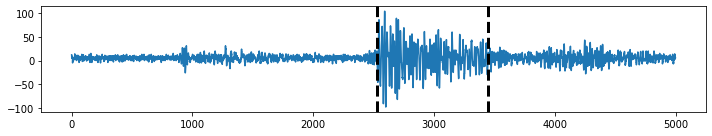

In [539]:
algo = rpt.Binseg(model='normal').fit_predict(dat["acoustic_data"][:5000].to_numpy(), n_bkps=2)
rpt.display(dat["acoustic_data"][:5000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 21: Binary segmentation result with N=5000 and 2 breakpoints

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f37b91416d8>])

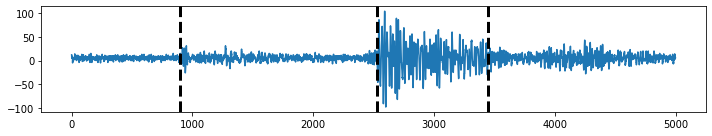

In [540]:
algo = rpt.Binseg(model='normal').fit_predict(dat["acoustic_data"][:5000].to_numpy(), n_bkps=3)
rpt.display(dat["acoustic_data"][:5000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 22: Binary segmentation result with N=5000 and 3 breakpoints

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f37bad602e8>])

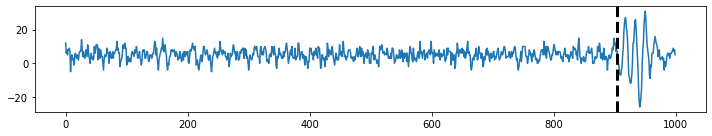

In [541]:
algo = rpt.Binseg(model='normal').fit_predict(dat["acoustic_data"][:1000].to_numpy(), n_bkps=1)
rpt.display(dat["acoustic_data"][:1000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 23: Binary segmentation result with N=1000 and 1 breakpoint

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f37ba9e1400>])

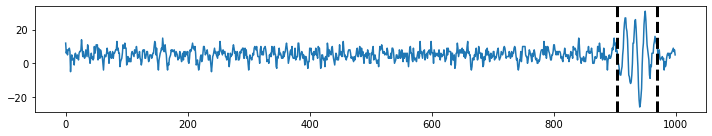

In [542]:
algo = rpt.Binseg(model='normal').fit_predict(dat["acoustic_data"][:1000].to_numpy(), n_bkps=2)
rpt.display(dat["acoustic_data"][:1000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 24: Binary segmentation result with N=1000 and 2 breakpoints

(<Figure size 720x144 with 1 Axes>,
 [<matplotlib.axes._subplots.AxesSubplot at 0x7f37b8d1c978>])

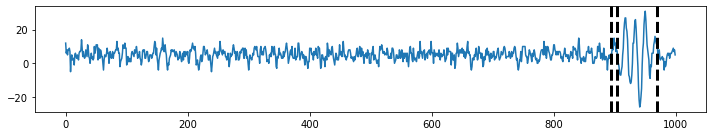

In [543]:
algo = rpt.Binseg(model='normal').fit_predict(dat["acoustic_data"][:1000].to_numpy(), n_bkps=3)
rpt.display(dat["acoustic_data"][:1000].to_numpy(), [], algo)
pl.xlabel('N')
pl.ylabel('Magnitude')

Figure 25: Binary segmentation result with N=1000 and 3 breakpoints

# 2b. Initial Imports for MCMC

In [30]:
import pandas as pd
import pylab as pl
import numpy as np
from scipy.optimize import curve_fit
%pylab inline
!pip install emcee
!pip install corner
import emcee
import corner
import scipy.optimize as op
from corner import hist2d
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

def line(x, slope, intercept):
    """ creates a line 
    x: exogenous variable
    slope: slope line parameter
    intercept: intercept line parameter
    """
    return x * slope + intercept

Populating the interactive namespace from numpy and matplotlib


/usr/local/lib/python3.6/dist-packages/IPython/core/magics/pylab.py:161: UserWarning: pylab import has clobbered these variables: ['ndim']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


     |████████████████████████████████| 51kB 1.7MB/s 
  Created wheel for corner: filename=corner-2.0.1-cp36-none-any.whl size=11642 sha256=c9e563e5d4b46226b9331a617360a27a3c6f1272c7543b129720b14b8744e4c1
  Stored in directory: /root/.cache/pip/wheels/70/d8/e5/e0e7974a2a5757483ea5a180c937041cf6872dc9993d78234a
Successfully built corner


Getting the data:

In [31]:
data = pd.read_csv("https://raw.githubusercontent.com/fedhere/MLTSA_FBianco/master/HW4/table1.dat",
                   sep=" ")
data.head()

,x,y,sy,sx,rxy
0,201,592,61,9,-0.84
1,244,401,25,4,0.31
2,47,583,38,11,0.64
3,287,402,15,7,-0.27
4,203,495,21,5,-0.33


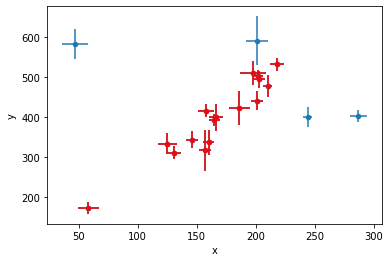

In [32]:
nall = len(data)
n = nall - 5
ax = data.plot(x='x', y="y", yerr="sy", xerr="sx", kind="scatter");
data[4:].plot(x='x', y="y", yerr="sy", xerr="sx", kind="scatter", ax=ax, color='r');

Figure 1: Our dataset plotted on a scatterplot with their errors.  The blue datapoints are our outliers, while the red are our inliers.

Now we'll get an initial guess of the fit by fitting on the dataset without the outliers.

In [0]:
rdata = data.iloc[4:, ]   # dataset without the outliers
pars = np.polyfit(rdata.x, rdata.y, 1)

In [34]:
pars

array([ 2.21665602, 28.84345193])

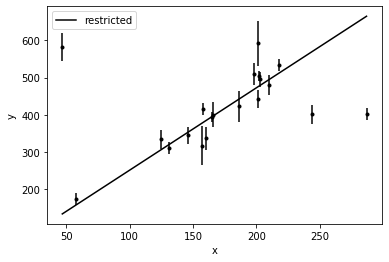

In [35]:
xx = np.arange(data.x.min(), data.x.max(), 0.1)
pl.errorbar(data.x, data.y, data.sy, fmt='.',  color='k')
pl.plot(xx, line(xx, pars[0], pars[1]), 'k-', label="restricted")
pl.xlabel("x")
pl.ylabel("y")
pl.legend();

Figure 2: Linear fit of our data, excluding the outliers.

# MCMC1: Performing the MCMC on the original dataset

First we're going to do a straight fit onto our data to see what the MCMC produces. 

Our Log-Likelihood:

In [0]:
#define a log likelihood that includes 
# - parameters slope and intercept (m, b), 
# - the probability that the point is an outlier Pb 
# - and a distribution fo the outliers, parameters (Yb, Vb), the mean and variance of the distribution of outliers

def lnlike(theta, x, y, yerr):
    '''log likelihood
    theta: 5 parameters vector, see prior for details,
    x: exogenous vextor
    y: endoogenous vector
    yerr: uncertainties vector
    '''
    
    m, b = theta
    #line fit model
    model = m * x + b
    #variance of data
    sig2 = yerr**2
    
    #normalization: this is importnat because we have 2 linearly combined pieces of model
    den = 2 * np.pi * sig2
    
    #this is the probability that the point comes from the line
    a = (1) / np.sqrt(den) *\
        exp(-(y-model)**2 /  2.0 / sig2)   
    return  np.sum(np.log(a))

Our Prior and Posterior:

In [0]:
def lnprior(theta):
    '''
    logprior on the parameters theta
    theta: 5 parameter vector: slpoe, intercept, 
                                Yb mean of the process that creates the outliers,
                                Pb probability that a point is an outlier,
                                V the variance of the process that generates outliers
    '''
    m, b = theta
    if -200 < b < 500 and 0 < m < 10.0 :
        #Pb is a probability so it is bound to 0-1
        return 0.0
    
    return -np.inf

def lnprob(theta, x, y, yerr):
    ''' log likelihood * log prior: the posterior
    '''
    lp = lnprior(theta)
    
    if not np.isfinite(lp) :
        return -np.inf
    lnl = lnlike(theta, x, y, yerr)
    if  np.isnan(lnl):
        return -np.inf
    return lp + lnl

Putting it all together and doing the MCMC

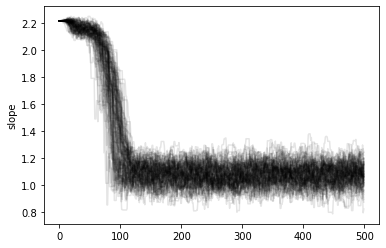

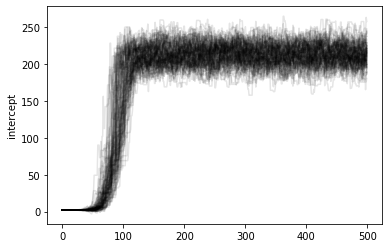

In [51]:
ndim, nwalkers = 2, 100 # number of variables optimized over, number of walkers per variable
init = np.hstack([pars[0], pars[0]]) # initialize the variable at a single point with some noise
pos = [init + 
       init * 1e-4 * np.random.randn(ndim) for i in range(nwalkers)] #  
sampler = emcee.EnsembleSampler(nwalkers, ndim, 
                                lnprob, 
                                args=(data.x, data.y,
                                     data.sy))
sampler.run_mcmc(pos, 500);
labels = ["slope", "intercept","Yb mean of the process that creates the outliers",
               "Pb probability that a point is an outlier",
                 "V" ]
for i in range(ndim):
    pl.figure()
    for j in range(100): 
        pl.plot(sampler.chain[j,:,i], 'k', alpha=0.1)
    pl.ylabel(labels[i])
        
        
burnout = 150
samples = sampler.chain[:, burnout:, :].reshape((-1, ndim))

Figure 3: Convergence of our walkers to the proper slope and intercept values.  Note the good behavior of the walkers--they tend to converge around a single value, and don't stray far from each other after the first 100 steps.

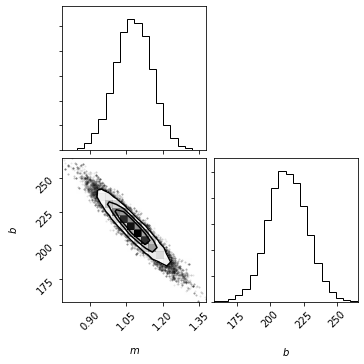

In [52]:
fig = corner.corner(samples, 
                        labels=["$m$", "$b$", "Y", r"$P_b$", "V"],
                        truths=init)
m_mcmc, b_mcmc = map(lambda v: (v[1], v[2]-v[1], v[1]-v[0]),
                             zip(*np.percentile(samples[:,:2], [16, 50, 84],
                                                axis=0)))

Figure 4: Contour plot of our variables with their distributions.  The contour itself indicates not only a stable convergence to our variables, but a relationship between them.  Note that for no relationship to exist between the variables, we would see a circle instead of an oval.  The distributions themselves are also Gaussian, indicating our walkers aren't getting stuck in any local minima.

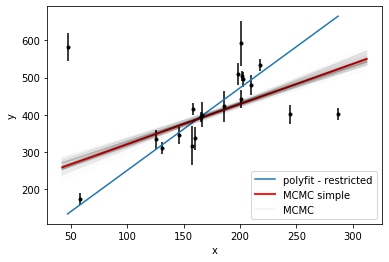

In [53]:
xl = np.arange(data.x.min() * 0.9, data.x.max() * 1.1, 10)
pl.errorbar(data.x, data.y, yerr=data.sy, fmt=".k")
pl.plot(xx, line(xx, pars[0], pars[1]), '-', label="polyfit - restricted")
pl.plot(xl, line(xl, m_mcmc[0], b_mcmc[0]), color="r", lw=2, 
        alpha=0.9, label="MCMC simple")
for m, b in samples[np.random.randint(len(samples), size=100)][:,:2]:
    pl.plot(xl, m*xl+b, color="k", alpha=0.02)
pl.plot(xl, m*xl+b, color="k", alpha=0.05, label="MCMC")
pl.legend();
pl.xlabel("x")
pl.ylabel("y")
pl.legend();

Figure 5: Plot of our MCMC results versus the polyfit result.  This fit isn't good--this is because we have substantial outliers, and we can't assume that all of the points are generated from the same process. In the next section, we shall assume a seperate Gaussian is present which produces the outliers.

# MCMC2: Assuming a seperate Gaussian Process containing outliers

Now we adjust our likelihood function to account for another Gaussian process which will produce our outliers.  To do this, we need to make the Gaussian's mean and variance parameters, and a probability that the data in the Gaussian are occuring.

In [0]:
#define a log likelihood that includes 
# - parameters slope and intercept (m, b), 
# - the probability that the point is an outlier Pb 
# - and a distribution fo the outliers, parameters (Yb, Vb), the mean and variance of the distribution of outliers

def lnlike(theta, x, y, yerr):
    '''log likelihood
    theta: 5 parameters vector, see prior for details,
    x: exogenous vextor
    y: endoogenous vector
    yerr: uncertainties vector
    '''
    
    m, b, Yb, Pb, V = theta
    #line fit model
    model = m * x + b
    #variance of data
    sig2 = yerr**2
    
    #normalization: this is importnat because we have 2 linearly combined pieces of model
    den = 2 * np.pi * sig2
    
    #this is the probability that the point comes from the line
    linelik = (1 - Pb) / np.sqrt(den) *\
        exp(-(y-model)**2 /  2.0 / sig2)  
    #this is the probability that it does not
    gausslik = Pb / np.sqrt(den + 2*np.pi*V) *\
        exp (-(y - Yb)**2 / 2 / (V + sig2))
    return  np.sum(np.log(linelik + gausslik))

In [0]:
def lnprior(theta):
    '''
    logprior on the parameters theta
    theta: 5 parameter vector: slpoe, intercept, 
                                Yb mean of the process that creates the outliers,
                                Pb probability that a point is an outlier,
                                V the variance of the process that generates outliers
    '''
    m, b, Yb, Pb, V = theta
    if -200 < b < 500 and 0 < m < 10.0 :
        #Pb is a probability so it is bound to 0-1
        if Pb < 0 or Pb > 1:
            return -np.inf
        # set some constraints on the mean of the process that creates the outliers
        if  Yb > ymean + 150 or Yb < ymean - 150:
            return -np.inf

        if V < 0:
            return -np.inf
        #print("3")
        return 0.0
    
    return -np.inf

def lnprob(theta, x, y, yerr):
    ''' log likelihood * log prior: the posterior
    '''
    lp = lnprior(theta)
    
    if not np.isfinite(lp) :
        return -np.inf
    lnl = lnlike(theta, x, y, yerr)
    if  np.isnan(lnl):
        return -np.inf
    return lp + lnl

In [0]:
ymean = data.y.mean()
#initialize from the restricted problem LA solution

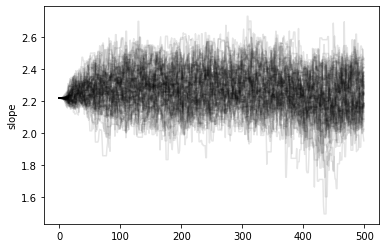

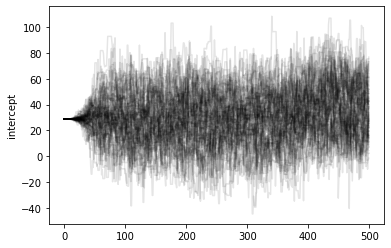

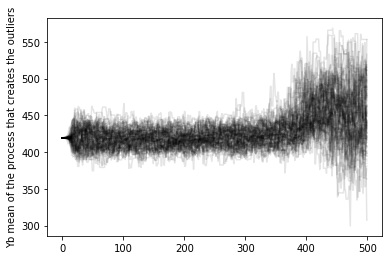

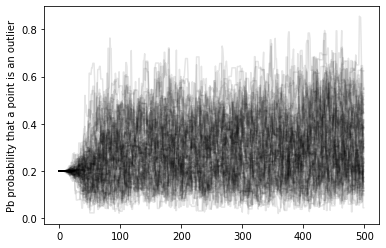

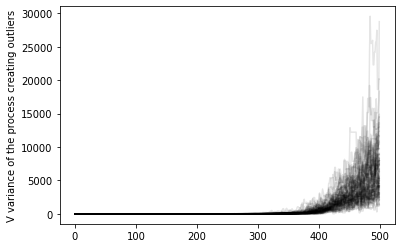

In [45]:
ndim, nwalkers = 5, 100 # number of variables optimized over, number of walkers per variable
init = np.hstack([pars[0], pars[1], ymean, 
                  0.2, 0.1]) # initialize the variable at a single point with some noise
pos = [init + 
       init * 1e-4 * np.random.randn(ndim) for i in range(nwalkers)] #  
sampler = emcee.EnsembleSampler(nwalkers, ndim, 
                                lnprob, 
                                args=(data.x, data.y,
                                     data.sy))
sampler.run_mcmc(pos, 500);

labels = ["slope", "intercept","Yb mean of the process that creates the outliers",
               "Pb probability that a point is an outlier",
                 "V variance of the process creating outliers" ]
for i in range(ndim):
    pl.figure()
    for j in range(100): 
        pl.plot(sampler.chain[j,:,i], 'k', alpha=0.1)
    pl.ylabel(labels[i])
        
        
burnout = 150
samples = sampler.chain[:, burnout:, :].reshape((-1, ndim))

Figure 6: Convergence of our walkers using our new likelihood function, assuming a seperate Gaussian process.  The convergence of Pb and V are shown to be unstable, as the walkers never settle around a single value.  However, as we will see below, the contours show our results are acceptable.

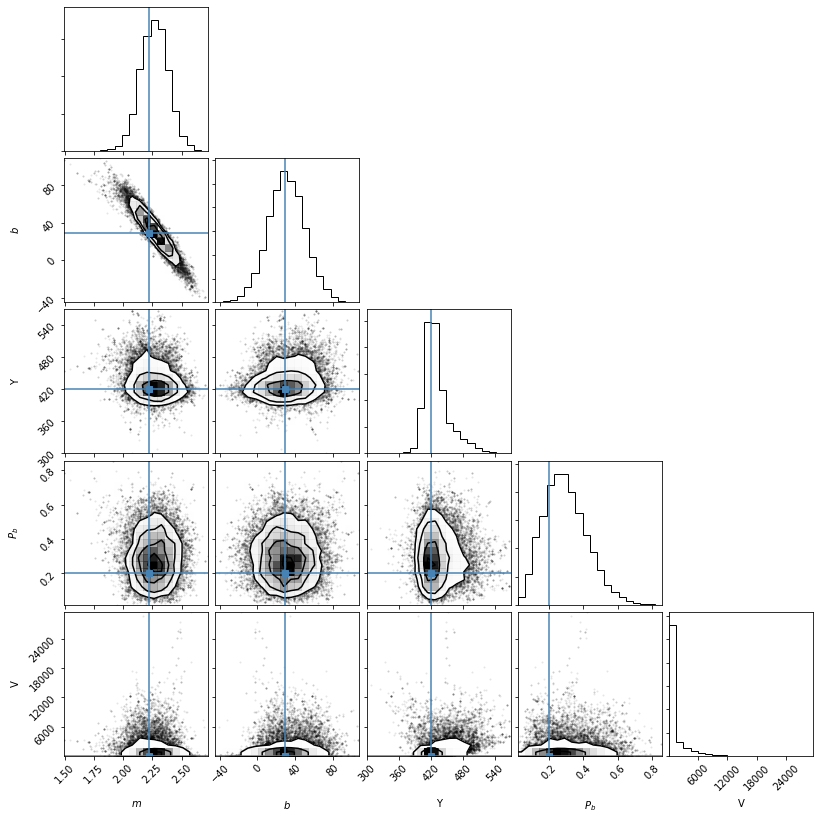

In [46]:
fig = corner.corner(samples, 
                        labels=["$m$", "$b$", "Y", r"$P_b$", "V"],
                        truths=init)
m_mcmc, b_mcmc = map(lambda v: (v[1], v[2]-v[1], v[1]-v[0]),
                             zip(*np.percentile(samples[:,:2], [16, 50, 84],
                                                axis=0)))

Figure 7: Contour and distribution plot of our variables.  Overall, except for the variance of the Gaussian, behavior of the convergence of variables looks good.  Signs that the variance did not converge properly are shown in the one-sided distribution and the strange looking contour plots of variance with the other variables.  However, as we show in Figure 8, the consequences of the poor convergence of variance are not extreme.

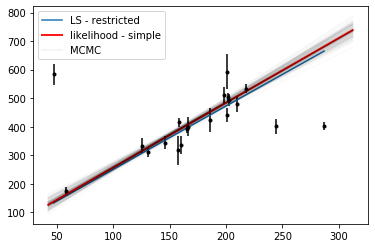

In [47]:
xl = np.arange(data.x.min() * 0.9, data.x.max() * 1.1, 10)
pl.errorbar(data.x, data.y, yerr=data.sy, fmt=".k")
pl.plot(xx, line(xx, pars[0], pars[1]), '-', label="LS - restricted")
pl.plot(xl, line(xl, m_mcmc[0], b_mcmc[0]), color="r", lw=2, alpha=0.9, label="likelihood - simple")
for m, b in samples[np.random.randint(len(samples), size=100)][:,:2]:
    pl.plot(xl, m*xl+b, color="k", alpha=0.02)
pl.plot(xl, m*xl+b, color="k", alpha=0.05, label="MCMC")
pl.legend();

Figure 8: Results of our line plot assuming a separate Gaussian.  This is much better compared to the fit we got in Figure 5, indicating that our method was successful in rooting out the outliers.

Instead of assuming a single probability for points in the Gaussian, we're going to get the probability of any individual point being an outlier.

# MCMC3: Getting the probability that each point is an outlier

To get all of the probabilities, we use a vector P instead of a single value P to do our MCMC on.  This changes the form of our equations slightly, and forces computation time up.

In [0]:
#define a log likelihood that includes 
# - parameters slope and intercept (m, b), 
# - the probability that the point is an outlier Pb 
# - and a distribution fo the outliers, parameters (Yb, Vb), the mean and variance of the distribution of outliers

def lnlikeP(theta, P, x, y, yerr):
    '''log likelihood
    theta: 4 parameters vector, see prior for details,
    x: exogenous vextor
    y: endoogenous vector
    yerr: uncertainties vector
    '''
    
    m, b, Yb, V = theta
    #line fit model
    model = m * x + b
    #variance of data
    sig2 = yerr**2
    
    #normalization: this is importnat because we have 2 linearly combined pieces of model
    den = 2 * np.pi * sig2
    #this is the probability that the point comes from the line
    linelik = 1 / np.sqrt(den) *\
        exp(-(y-model)**2 /  2.0 / sig2)  
    #this is the probability that it does not
    gausslik = 1 / np.sqrt(den + 2*np.pi*V) *\
        exp (-(y - Yb)**2 / 2 / (V + sig2))
    return  np.sum(P * np.log(linelik) + (1 - P) * np.log(gausslik))

In [429]:
print("test lnlikP:", lnlikeP((pars[0], pars[1], 400, 300), np.random.rand(len(x)), 
        data['x'], data['y'], data.sy))

test lnlikP: -229.42657719891386


In [0]:
def lnpriorP(theta, P):
    '''
    logprior on the parameters theta
    theta: 4 parameter vector: slope, intercept, 
                                Yb mean of the process that creates the outliers,
                                V the variance of the process that generates outliers
    '''
    m, b, Yb, V = theta
    if -200 < b < 500 and 0 < m < 10.0 :
        #Pb is a probability so it is bound to 0-1
        if False in [0 <= P[x] <= 1 for x in range(len(P))]:
            return -np.inf
        # set some constraints on the mean of the process that creates the outliers
        if  Yb > ymean + 150 or Yb < ymean - 150:
            return -np.inf

        if V < 0:
            return -np.inf
        #print("3")
        return 0.0
    
    return -np.inf

def lnprobP(theta, x, y, yerr):
    ''' log likelihood * log prior: the posterior
    '''
    P = theta[4:]
    theta = theta[:4]
    lp = lnpriorP(theta, P)
    if not np.isfinite(lp) :
        return -np.inf
    lnl = lnlikeP(theta, P, x, y, yerr)
    if  np.isnan(lnl):
        return -np.inf
    return lp + lnl

Now, we'll do our MCMC.

In [0]:
probsinit = np.ones(len(x)) * 0.5
ndim, nwalkers = 24, 100 # number of variables optimized over, number of walkers per variable
init = np.hstack([pars[0], pars[1], ymean, 
                    0.1]) # initialize the variable at a single point with some noise
pos = [np.append(init + init * 1e-4 * np.random.randn(4), probsinit + probsinit * 1e-4 * (np.random.randn(20))) for i in range(nwalkers)] #  
sampler = emcee.EnsembleSampler(nwalkers, ndim, 
                                lnprobP, 
                                args=(data.x, data.y,
                                     data.sy))
sampler.run_mcmc(pos, 5000);


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_

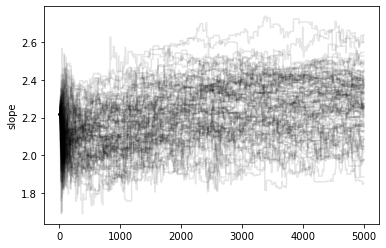

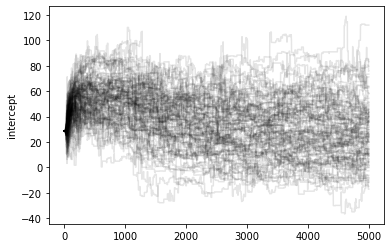

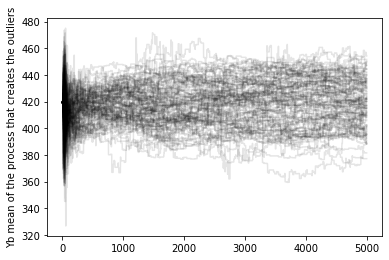

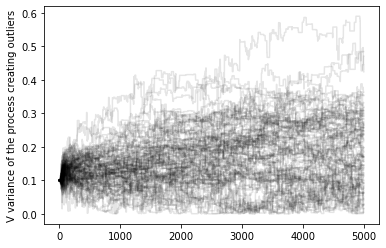

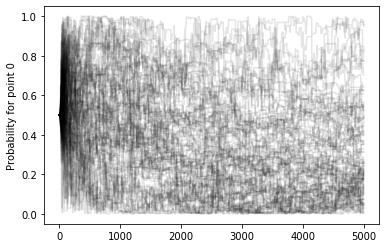

...

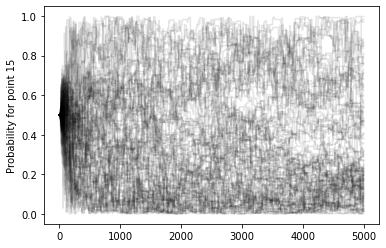

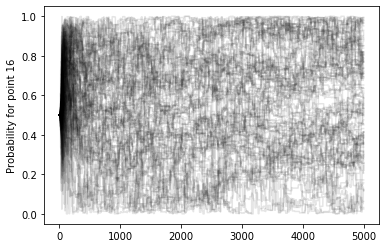

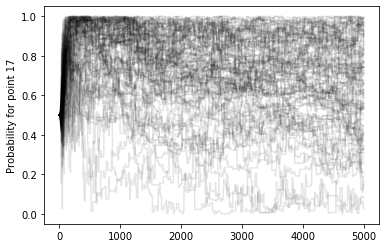

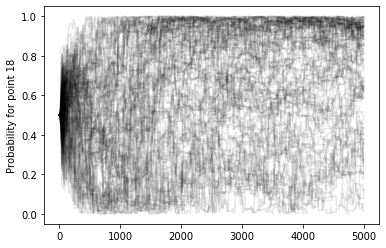

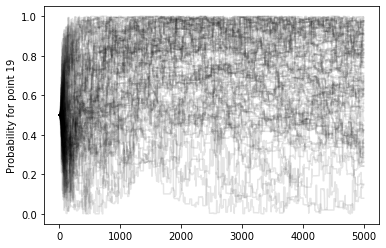

In [432]:

labels = ["slope", "intercept","Yb mean of the process that creates the outliers",
                 "V variance of the process creating outliers" ]
for i in range(ndim):
    pl.figure()
    for j in range(100): 
        pl.plot(sampler.chain[j,:,i], 'k', alpha=0.1)
    if i < 4:
      pl.ylabel(labels[i])
    else:
      pl.ylabel("Probability for point %s" % (i-4))
        

Figure 9: Convergence of our walkers to our random variables.  Note that as the number of variables increase in our MCMC, the convergence becomes more erratic (thus indicating that something like Gibb's sampling would be more appropriate for high-dimensional data).  Although there looks like a general trend in a certain direction for our variables and some of the probabilities, the rest of the probabilities look essentially random.

Now let's plot our fit, errors and all.

In [453]:
samples = sampler.chain[:, 150:, :].reshape((-1, ndim))
samples[:,4:].shape

(485000, 20)

In [0]:
m_mcmc, b_mcmc = map(lambda v: (v[1], v[2]-v[1], v[1]-v[0]),
                             zip(*np.percentile(samples[:,:2], [16, 50, 84],
                                                axis=0)))

In [509]:
print("Mean: %s, Intercept: %s" % (m_mcmc[0], b_mcmc[0]))

Mean: 2.125613739677025, Intercept: 53.95863898117021


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  if sys.path[0] == '':


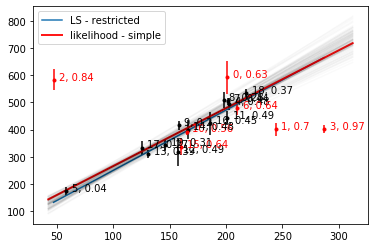

In [507]:
a = []
for i in range(20):
  a.append(np.mean(samples[:,i+4]))

col = ['r', 'k']
b = [a[i] >= 0.5 for i in range(len(a))]
c = [~b[i] for i in range(len(b))]
xl = np.arange(data.x.min() * 0.9, data.x.max() * 1.1, 10)
pl.errorbar(data.x[b], data.y[b], yerr=data.sy[b], fmt='.k')
pl.errorbar(data.x[c], data.y[c], yerr=data.sy[c], fmt='.r')
for i in range(len(b)):
  pl.annotate(str(i) + ', ' + str(round(1-a[i], 2)), (x[i]+5, y[i]), c=col[b[i]])
pl.plot(xx, line(xx, pars[0], pars[1]), '-', label="LS - restricted")
pl.plot(xl, line(xl, m_mcmc[0], b_mcmc[0]), color="r", lw=2, alpha=0.9, label="likelihood - simple")
for m, b in samples[np.random.randint(len(samples), size=100)][:,:2]:
    pl.plot(xl, m*xl+b, color="k", alpha=0.02)
pl.legend();

Figure 10: Plot of our fit, with the probability that the point is an outlier printed next to it.  Red indicates outliers, Black indicates inliers.  Note that our MCMC caught all of the outliers in our dataset, but had a few false positives thrown in there.  Overall, the results are impressive, and datapoints very far from the line (such as points 3 and 2) have P>0.8 that it's an outlier, a result that we would like to see.

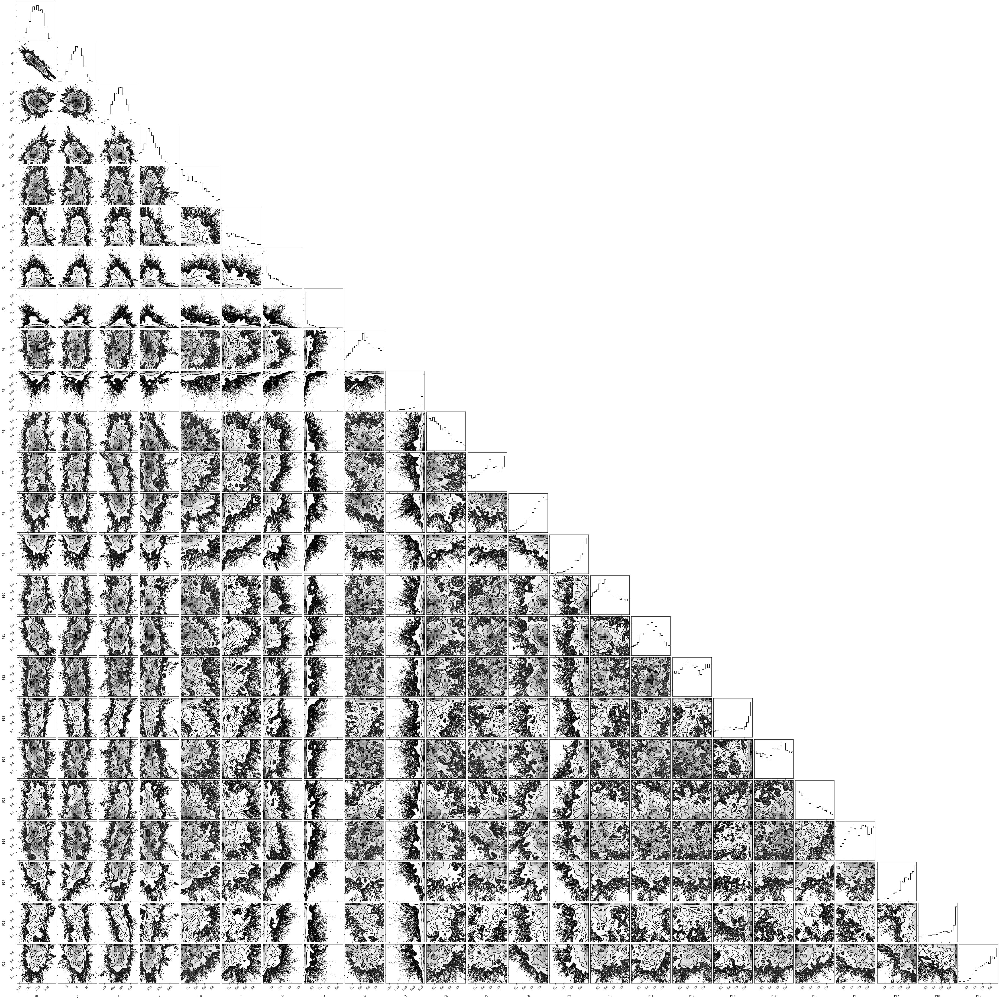

In [514]:
fig = corner.corner(samples, 
                        labels=["$m$", "$b$", "Y", "V", "P0",
                                "P1", "P2", "P3", "P4", "P5", 
                                "P6", "P7", "P8", "P9", "P10", 
                                "P11", "P12", "P13", "P14", "P15", 
                                "P16", "P17", "P18", "P19"])

Figure 11: Contour plots of the convergence of our variables in the last MCMC.  This plot is extrememly useful in showing the complexity of the problem of convergence in our MCMC setting.  Some of the plots, like the variables, look really well behaved and result in what we would expect.  Some of the others, such as the probability plots, show great complexity--points 3 and 5 for example shows extreme convergence to 0 and 1 (note that P=0 indicates an outlier, I structured it opposite to the book but the results are the same).  Point 7 shows erratic structure, and indeed its distribution is slanted downwards, which is something we wouldn't want to see.  The erratic behavior again could indicate the necessity of using algorithms that behave well in high-dimension context, such as Gibb's sampling.